# Importation

In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.ticker as mtick
import pandas as pd
import ast
from wordcloud import WordCloud
from collections import Counter
import nltk
from nltk.corpus import stopwords

## 1. Data loading and basic exploration 

In this section we will first load the data and name the column 

In [2]:
file_movie = './Data/movie.metadata.tsv'
movie_metadata_df = pd.read_csv(file_movie, sep='\t', header=None)

# SHOULD WE REMOVE MOVIES IN FRONT OF ALL ?

In [3]:
movie_metadata_df.columns = [
    'Wikipedia movie ID',
    'Freebase movie ID',
    'Movie name',
    'Movie release date',
    'Movie box office revenue',
    'Movie runtime',
    'Movie languages',
    'Movie countries',
    'Movie genres'
]

In [4]:
movie_metadata_df.head()

,Wikipedia movie ID,Freebase movie ID,Movie name,Movie release date,Movie box office revenue,Movie runtime,Movie languages,Movie countries,Movie genres
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/02n4kr"": ""Mystery"", ""/m/03bxz7"": ""Biograp..."
2,28463795,/m/0crgdbh,Brun bitter,1988,NaN,83.0,"{""/m/05f_3"": ""Norwegian Language""}","{""/m/05b4w"": ""Norway""}","{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D..."
3,9363483,/m/0285_cd,White Of The Eye,1987,NaN,110.0,"{""/m/02h40lc"": ""English Language""}","{""/m/07ssc"": ""United Kingdom""}","{""/m/01jfsb"": ""Thriller"", ""/m/0glj9q"": ""Erotic..."
4,261236,/m/01mrr1,A Woman in Flames,1983,NaN,106.0,"{""/m/04306rv"": ""German Language""}","{""/m/0345h"": ""Germany""}","{""/m/07s9rl0"": ""Drama""}"


Taking a look at the raw data, you can see that the movie genres, countries, and languages are in a dictionary-like format. We’ll need to rework these columns to make them more accessible and easier to use.

In [5]:
len(movie_metadata_df)

81741

In [6]:
movie_metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81741 entries, 0 to 81740
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Wikipedia movie ID        81741 non-null  int64  
 1   Freebase movie ID         81741 non-null  object 
 2   Movie name                81741 non-null  object 
 3   Movie release date        74839 non-null  object 
 4   Movie box office revenue  8401 non-null   float64
 5   Movie runtime             61291 non-null  float64
 6   Movie languages           81741 non-null  object 
 7   Movie countries           81741 non-null  object 
 8   Movie genres              81741 non-null  object 
dtypes: float64(2), int64(1), object(6)
memory usage: 5.6+ MB


In [10]:
print(movie_metadata_df['Movie genres'].apply(type).value_counts())
print(movie_metadata_df['Movie release date'].apply(type).value_counts())

<class 'str'>    81741
Name: Movie genres, dtype: int64
<class 'str'>      74839
<class 'float'>     6902
Name: Movie release date, dtype: int64


The dataset is composed of 81'741 movies. We will now have a look at the number of NaN in each categories.

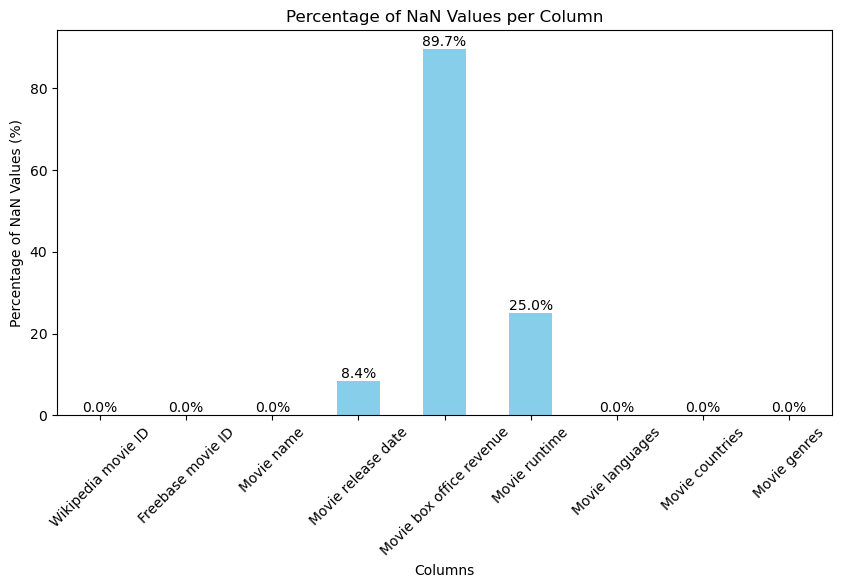

In [11]:
# Calculate the percentage of NaN values in each column
na_percentage = (movie_metadata_df.isna().sum() / len(movie_metadata_df)) * 100

# Plot
plt.figure(figsize=(10, 5))
bars = na_percentage.plot(kind='bar', color='skyblue')

for i, value in enumerate(na_percentage):
    plt.text(i, value, f'{value:.1f}%', ha='center', va='bottom')

plt.xlabel('Columns')
plt.xticks(rotation=45)
plt.ylabel('Percentage of NaN Values (%)')
plt.title('Percentage of NaN Values per Column')
plt.show()


Most columns have little to no missing data, except for 'Movie box office revenue' with a significant 89.7% missing and 'Movie runtime' with 25% missing. 'Movie release date' also has some missing values at 8.4%. These gaps could impact certain types of analyses, particularly those involving financial and runtime data.

## 2. Data Cleaning

In [12]:
metadata_df = movie_metadata_df.copy()

Function that convert the columns that look like dictionnary in lists for better analysis access

In [13]:
def convert_to_list(df, column_name):
    #Convert to dictionnary 
    df[column_name] = df[column_name].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
    #Convert to list
    df[column_name] = df[column_name].apply(lambda x: list(x.values()) if isinstance(x, dict) else None)
    return df[column_name]

In [14]:
metadata_df['Movie genres'] = convert_to_list(metadata_df, 'Movie genres')
metadata_df['Movie languages'] = convert_to_list(metadata_df, 'Movie languages')
metadata_df['Movie countries'] = convert_to_list(metadata_df, 'Movie countries')

In [15]:
metadata_df.head()

,Wikipedia movie ID,Freebase movie ID,Movie name,Movie release date,Movie box office revenue,Movie runtime,Movie languages,Movie countries,Movie genres
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,[English Language],[United States of America],"[Thriller, Science Fiction, Horror, Adventure,..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,[English Language],[United States of America],"[Mystery, Biographical film, Drama, Crime Drama]"
2,28463795,/m/0crgdbh,Brun bitter,1988,NaN,83.0,[Norwegian Language],[Norway],"[Crime Fiction, Drama]"
3,9363483,/m/0285_cd,White Of The Eye,1987,NaN,110.0,[English Language],[United Kingdom],"[Thriller, Erotic thriller, Psychological thri..."
4,261236,/m/01mrr1,A Woman in Flames,1983,NaN,106.0,[German Language],[Germany],[Drama]


We can now see that the columns containing information about movie languages, countries, and genres are indeed formatted as lists. 

For our analysis, having the full release date isn't necessary; just the year is enough. Therefore, we converted the release date into a year format. During this modification, we noticed an incorrect release date in a specific row. After identifying the movie, we searched the correct release date on wikipedia. We decided to manually correct this particular date, as the error was due to a typo showing "1010" instead of "2010."

In [16]:
release_date = metadata_df .iloc[62836]['Movie release date']
release_date

'1010-12-02'

In [17]:
metadata_df .at[62836, 'Movie release date'] = "2010-12-02"

# Verify the change
print("Updated Release Date at position 62836:", metadata_df .at[62836, 'Movie release date'])

Updated Release Date at position 62836: 2010-12-02


In [18]:
# Modify the release date to only have year, while preserving values already in year format
metadata_df_year = metadata_df.copy()
metadata_df_year['Movie release date'] = pd.to_datetime(metadata_df_year['Movie release date'], errors='coerce').dt.year.fillna(metadata_df_year['Movie release date']).astype('Int64')


In [19]:
metadata_df_year.head()

,Wikipedia movie ID,Freebase movie ID,Movie name,Movie release date,Movie box office revenue,Movie runtime,Movie languages,Movie countries,Movie genres
0,975900,/m/03vyhn,Ghosts of Mars,2001,14010832.0,98.0,[English Language],[United States of America],"[Thriller, Science Fiction, Horror, Adventure,..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000,NaN,95.0,[English Language],[United States of America],"[Mystery, Biographical film, Drama, Crime Drama]"
2,28463795,/m/0crgdbh,Brun bitter,1988,NaN,83.0,[Norwegian Language],[Norway],"[Crime Fiction, Drama]"
3,9363483,/m/0285_cd,White Of The Eye,1987,NaN,110.0,[English Language],[United Kingdom],"[Thriller, Erotic thriller, Psychological thri..."
4,261236,/m/01mrr1,A Woman in Flames,1983,NaN,106.0,[German Language],[Germany],[Drama]


In [20]:
metadata_df_year['Movie release date'].describe()

count        74839.0
mean     1977.489892
std         28.88609
min           1888.0
25%           1956.0
50%           1985.0
75%           2004.0
max           2016.0
Name: Movie release date, dtype: Float64

We see that the dataset years range from 1888 to 2016.

## CHECK THAT REALLY YEAR ON THE WHOLE DATASET ?

In [21]:
#Remove the years that are NaN as we are intereseted in date
print(metadata_df_year['Movie release date'].isna().value_counts())
metadata_df_cleaned = metadata_df_year.dropna(subset=['Movie release date'])
metadata_df_cleaned['Movie release date'].isna().value_counts()

False    74839
True      6902
Name: Movie release date, dtype: int64


False    74839
Name: Movie release date, dtype: int64

We removed rows where the release date was missing, which, as shown in the previous graph, accounts for 8.4% of the total data. After removing these rows, we verified that the operation was successful

## 3. Movie languages data exploration 

In [22]:
all_languages = metadata_df_cleaned['Movie languages'].explode()

language_counts = all_languages.value_counts()

print(language_counts)


English Language                        39680
Spanish Language                         3532
Hindi Language                           3432
French Language                          3323
Silent film                              3079
                                        ...  
Australian Aboriginal Pidgin English        1
Pawnee Language                             1
Tok Pisin Language                          1
Picard Language                             1
Kuna language                               1
Name: Movie languages, Length: 204, dtype: int64


From our initial analysis, it's clear that English is dominant compared to other languages in the dataset.

In [23]:
num_unique_languages = all_languages.nunique()
print("Number of unique languages:", num_unique_languages)

Number of unique languages: 204


The dataset contains 204 different languages.

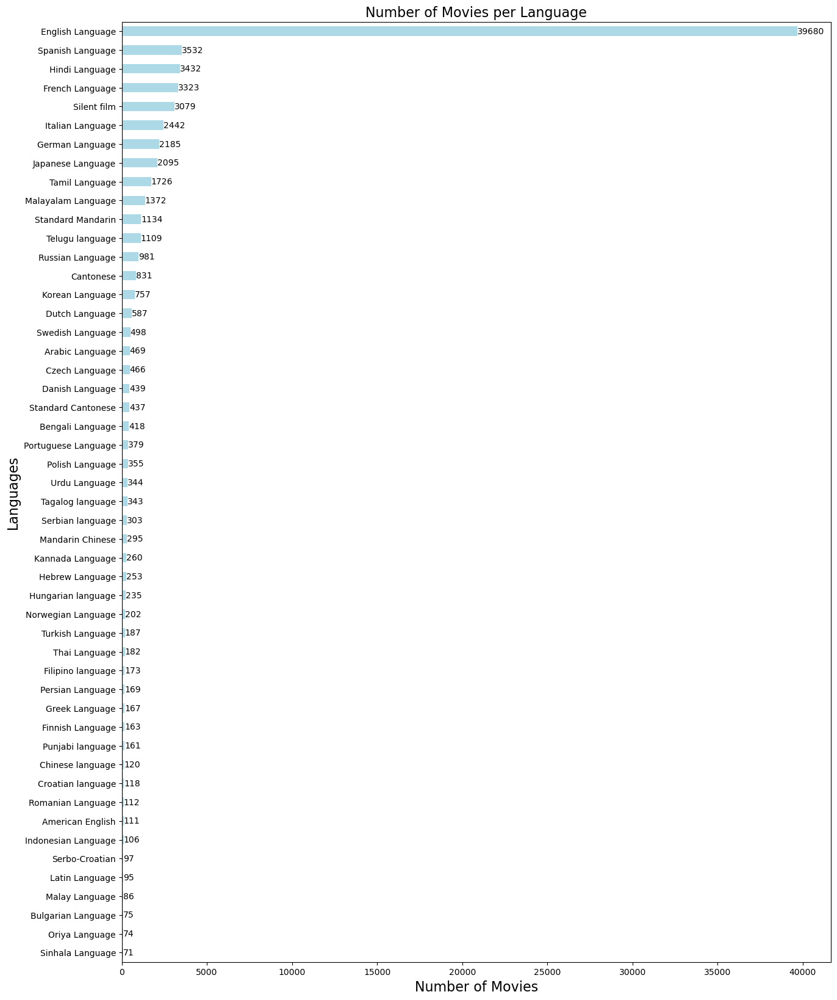

In [24]:
# Plot the number of movies per language 
plt.figure(figsize=(15, 20))
bars = language_counts.head(50).sort_values(ascending=True).plot(kind='barh', color='lightblue')

for index, value in enumerate(language_counts.head(50).sort_values(ascending=True)):
    plt.text(value, index, str(value), va='center')

plt.xlabel('Number of Movies',fontsize=16)
plt.ylabel('Languages',fontsize=16)
plt.title('Number of Movies per Language', fontsize=16)

plt.show()

As previously seen, English is largely dominant. This can be attributed to its role as a global lingua franca, making films more accessible to international audiences. Additionally, major movie industries in countries like the United Kingdom and other English-speaking regions contribute to the high number of English-language films.

For better visibility, we chose to display only the top 50 languages in this chart. It is also noticeable that the number of movies per language drops off quickly after the most common languages, highlighting the dominance of a few major languages in movie production and a long tail of less commonly represented languages.

## SHOW LESS LANGUAGES ? 

## 4. Movie genres data exploration 

In [25]:
all_genres = metadata_df_cleaned['Movie genres'].explode()

genres_counts = all_genres.value_counts()

print(genres_counts)

Drama                   32015
Comedy                  15648
Romance Film             9770
Black-and-white          8817
Thriller                 8408
                        ...  
Comdedy                     1
C-Movie                     1
Linguistics                 1
Silhouette animation        1
Homoeroticism               1
Name: Movie genres, Length: 363, dtype: int64


In [26]:
num_unique_genre = all_genres.nunique()
print("Number of unique genres:", num_unique_genre)

Number of unique genres: 363


The dataset contain 363 different genres.

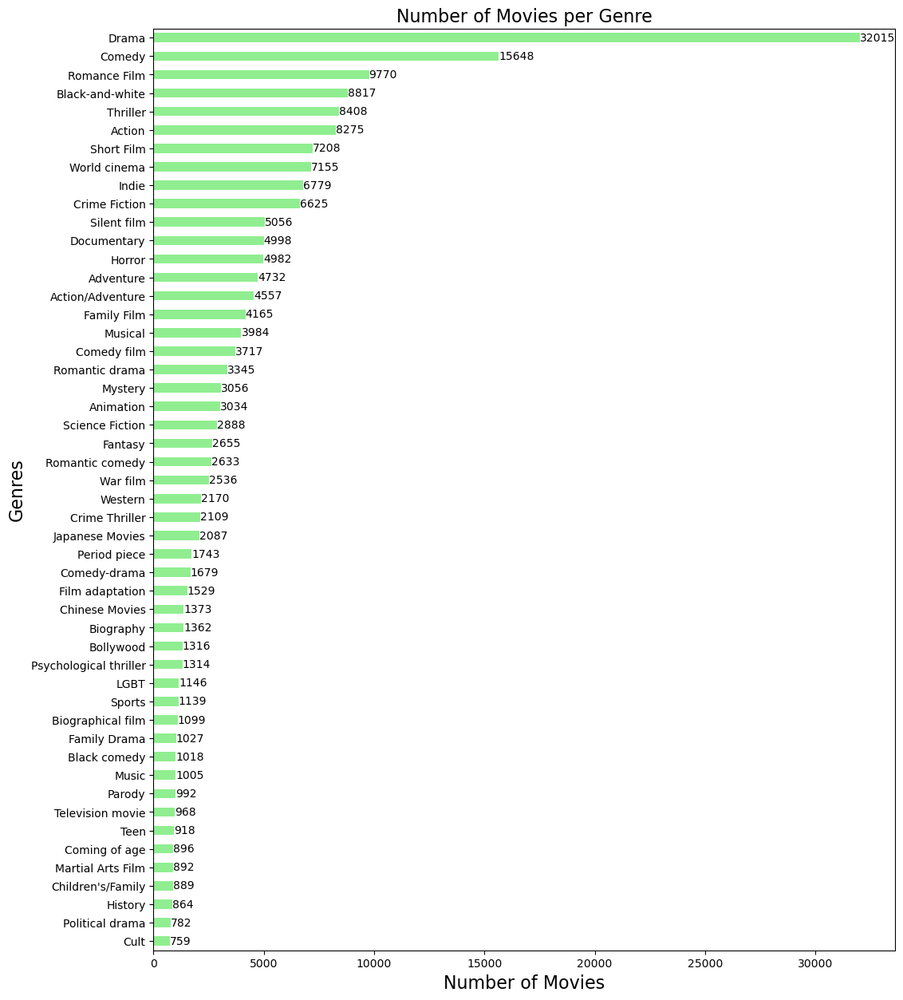

In [47]:
# Plot the number of movies per top 50 genres
plt.figure(figsize=(12, 15))
bars = genres_counts.head(50).sort_values(ascending=True).plot(kind='barh', color='lightgreen')

for index, value in enumerate(genres_counts.head(50).sort_values(ascending=True)):
    plt.text(value, index, str(value), va='center')

plt.xlabel('Number of Movies', fontsize=16)
plt.ylabel('Genres', fontsize=16)
plt.title('Number of Movies per Genre', fontsize=16)  

plt.show()


Drama is the clear leader when it comes to movie genres, followed by Comedy and Romance. This makes sense since these genres appeal to a wide range of audiences. Genres like Thriller, Action, and Documentary are also popular, showing that people enjoy excitement and real-life stories. On the other end, niche genres like 'Cult' and 'Political drama' are much less common, which isn't surprising given their more specific audience.

Once again we decided to show only the top 50 genres to keep the chart clear and easy to read. 

## 4. Movie countries data exploration 

In [27]:
all_countries = metadata_df_cleaned['Movie countries'].explode()

countries_counts = all_countries.value_counts() 

print(countries_counts)

United States of America    33197
India                        7764
United Kingdom               7452
France                       4199
Italy                        3017
                            ...  
Republic of China               1
Macau                           1
Palestinian Territories         1
German Language                 1
Ukranian SSR                    1
Name: Movie countries, Length: 146, dtype: int64


In [28]:
num_unique_countries = all_countries.nunique()
print("Number of unique countries:", num_unique_countries)

Number of unique countries: 146


The dataset contain 146 different countries.

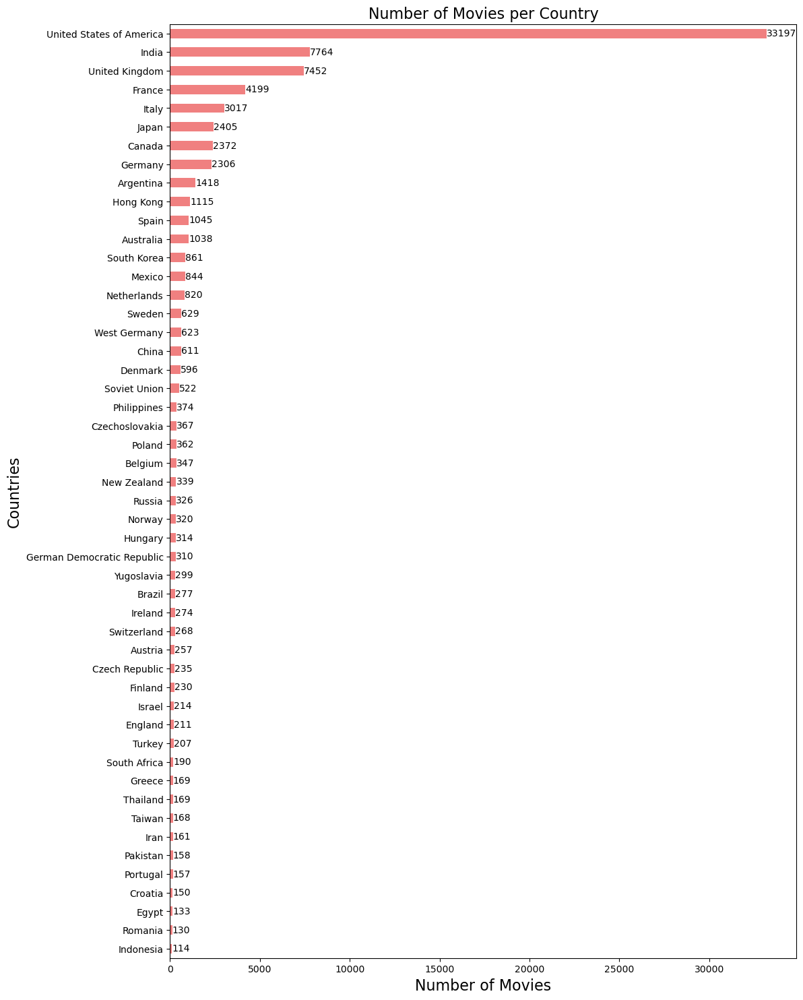

In [31]:
# Plot the number of movies per top 50 country
plt.figure(figsize=(12, 18))
bars = countries_counts.head(50).sort_values(ascending=True).plot(kind='barh', color='lightcoral')

for index, value in enumerate(countries_counts.head(50).sort_values(ascending=True)):
    plt.text(value, index, str(value), va='center')

plt.xlabel('Number of Movies', fontsize=16)
plt.ylabel('Countries', fontsize=16)
plt.title('Number of Movies per Country', fontsize=16)  

plt.show()


The United States has the most movies by far, showing its huge impact on the film industry. India and the United Kingdom come next, thanks to Bollywood and British cinema. France, Italy, and Japan also produce a lot of movies. The numbers drop as you go down the list, with fewer movies made in other countries.

Once again we decided to show only the top 50 countries to keep the chart clear and easy to read. 

## 5. Movie release year data exploration 

In [32]:
all_years = metadata_df_cleaned['Movie release date'].explode()

years_counts = all_years.value_counts()

print(years_counts)

2008    2465
2006    2434
2007    2389
2009    2247
2005    2102
        ... 
1890       2
1904       1
1893       1
1889       1
1888       1
Name: Movie release date, Length: 129, dtype: Int64


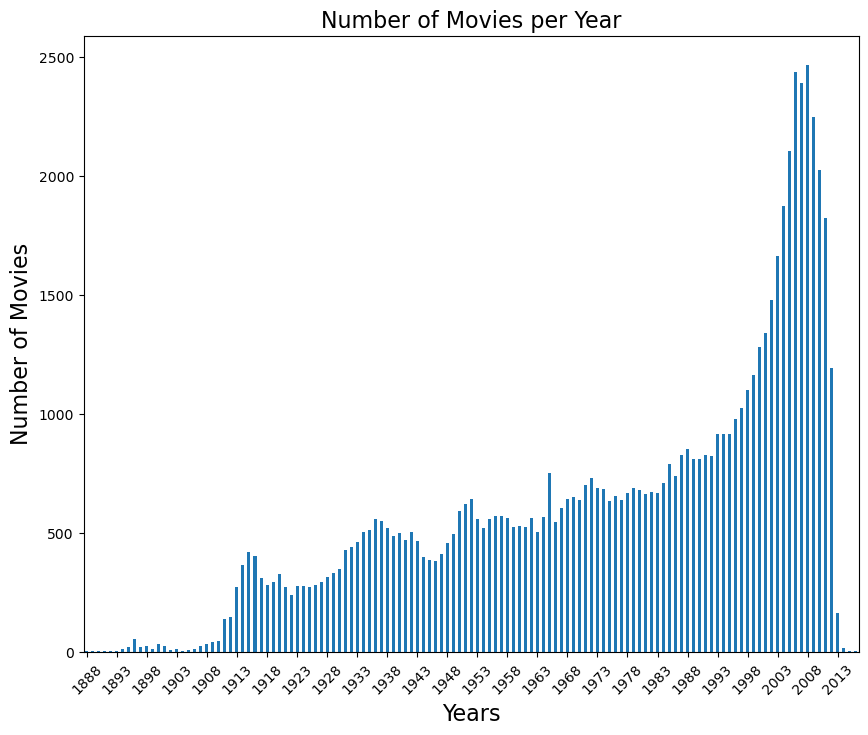

In [33]:
plt.figure(figsize=(10, 8))  
plot_years_counts = all_years.value_counts().sort_index().plot(kind='bar')
plt.xlabel('Years', fontsize=16 )
plt.ylabel('Number of Movies', fontsize=16)
plt.title('Number of Movies per Year', fontsize=16)

plt.xticks(range(0, len(all_years.value_counts().sort_index()), 5), 
           all_years.value_counts().sort_index().index[::5], 
           rotation=45)

plt.show()


The movie production has grown steadily over time, with a big jump starting in the 1990s and peaking in the early 2000s. The increase after the 1980s is likely due to better technology and more people making movies around the world. The early years have fewer movies because the film industry was just getting started.

## 6. Movie per year for top countries 

In [34]:
# Get top 10 countries releasing movies
top_10_countries = countries_counts.head(10).index

# Get one country per row (since some movies contain more that one countries)
expanded_df = metadata_df_cleaned.explode('Movie countries')

top_countries_df = expanded_df[expanded_df['Movie countries'].isin(top_10_countries)]
top_countries_df.head()

,Wikipedia movie ID,Freebase movie ID,Movie name,Movie release date,Movie box office revenue,Movie runtime,Movie languages,Movie countries,Movie genres
0,975900,/m/03vyhn,Ghosts of Mars,2001,14010832.0,98.0,[English Language],United States of America,"[Thriller, Science Fiction, Horror, Adventure,..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000,NaN,95.0,[English Language],United States of America,"[Mystery, Biographical film, Drama, Crime Drama]"
3,9363483,/m/0285_cd,White Of The Eye,1987,NaN,110.0,[English Language],United Kingdom,"[Thriller, Erotic thriller, Psychological thri..."
4,261236,/m/01mrr1,A Woman in Flames,1983,NaN,106.0,[German Language],Germany,[Drama]
5,13696889,/m/03cfc81,The Gangsters,1913,NaN,35.0,"[Silent film, English Language]",United States of America,"[Short Film, Silent film, Indie, Black-and-whi..."


In [35]:
# Count movies per year for each country
movies_per_year_countries = top_countries_df.groupby(['Movie countries', 'Movie release date']).size().unstack(fill_value=0)
movies_per_year_countries.head()

Movie release date,1888,1889,1890,1891,1892,1893,1894,1895,1896,1897,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Movie countries,,,,,,,,,,,,,,,,,,,,,
Argentina,0,0,0,0,0,0,0,0,0,1,...,12,6,7,12,14,3,1,0,0,0
Canada,0,0,0,0,0,0,0,0,0,0,...,152,140,140,108,74,29,5,0,0,0
France,0,0,0,0,3,0,0,9,42,9,...,120,130,146,128,91,52,9,0,0,0
Germany,0,0,0,0,0,0,0,3,0,0,...,79,100,93,71,62,32,1,0,0,0
Hong Kong,0,0,0,0,0,0,0,0,0,0,...,35,32,35,40,23,14,0,0,0,0


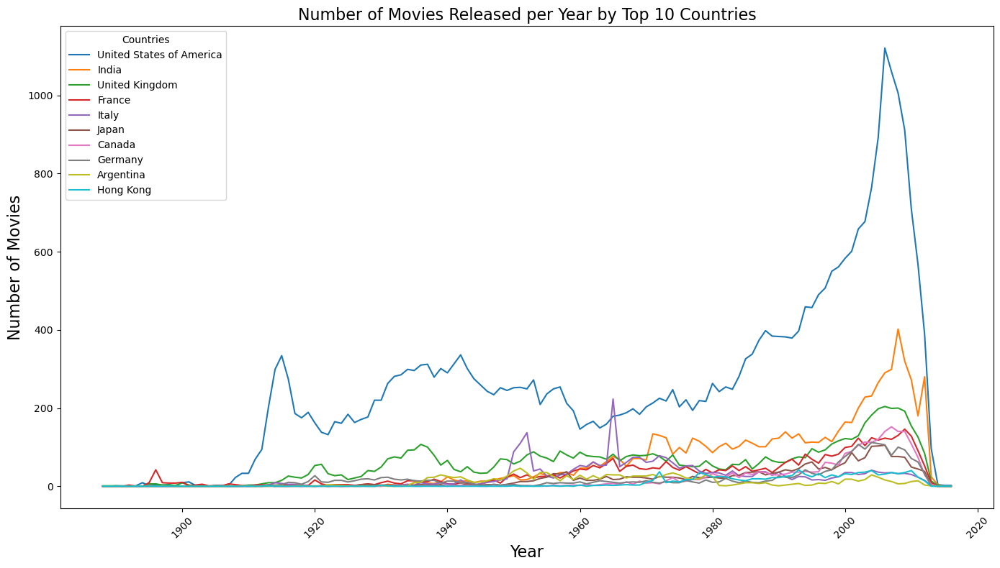

In [36]:
plt.figure(figsize=(14, 8))

# Plot a line for each top country
for country in top_10_countries:
    if country in movies_per_year_countries.index:  
        plt.plot(movies_per_year_countries.columns, movies_per_year_countries.loc[country], label=country)

plt.xlabel('Year', fontsize=16)
plt.ylabel('Number of Movies', fontsize=16)
plt.title('Number of Movies Released per Year by Top 10 Countries', fontsize=16)
plt.legend(title='Countries')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The United States has consistently produced the most movies over time, with a sharp increase from the 1970s and peaking in the early 2000s. India follows as the second-highest producer, with a noticeable growth in the late 20th century. Other countries like the United Kingdom, France, and Italy show steady but much smaller production levels. The graph highlights the dominance of the U.S. and India in global movie production.

For the next part of the analysis, we grouped the data by decade to see clearer trends and changes in movie production over time. 

In [37]:
# Group by decade by summing every 10 years
movies_per_decade = movies_per_year_countries.groupby((movies_per_year_countries.columns // 10) * 10, axis=1).sum()
movies_per_decade

Movie release date,1880,1890,1900,1910,1920,1930,1940,1950,1960,1970,1980,1990,2000,2010
Movie countries,,,,,,,,,,,,,,
Argentina,0,1,2,4,12,97,183,290,253,259,74,54,159,30
Canada,0,0,0,3,0,6,14,18,60,140,303,417,1195,216
France,0,79,34,26,52,117,93,272,503,453,419,682,1189,280
Germany,0,3,0,51,156,162,66,53,102,112,123,346,966,166
Hong Kong,0,0,0,1,0,3,0,4,25,194,199,277,335,77
India,0,0,0,3,7,56,160,270,606,1061,1045,1235,2562,759
Italy,0,0,2,34,6,45,101,568,754,559,315,220,343,70
Japan,0,0,0,1,16,27,31,204,199,217,289,467,820,134
United Kingdom,2,21,20,145,338,791,486,743,766,654,559,840,1708,379


## Not Normalised

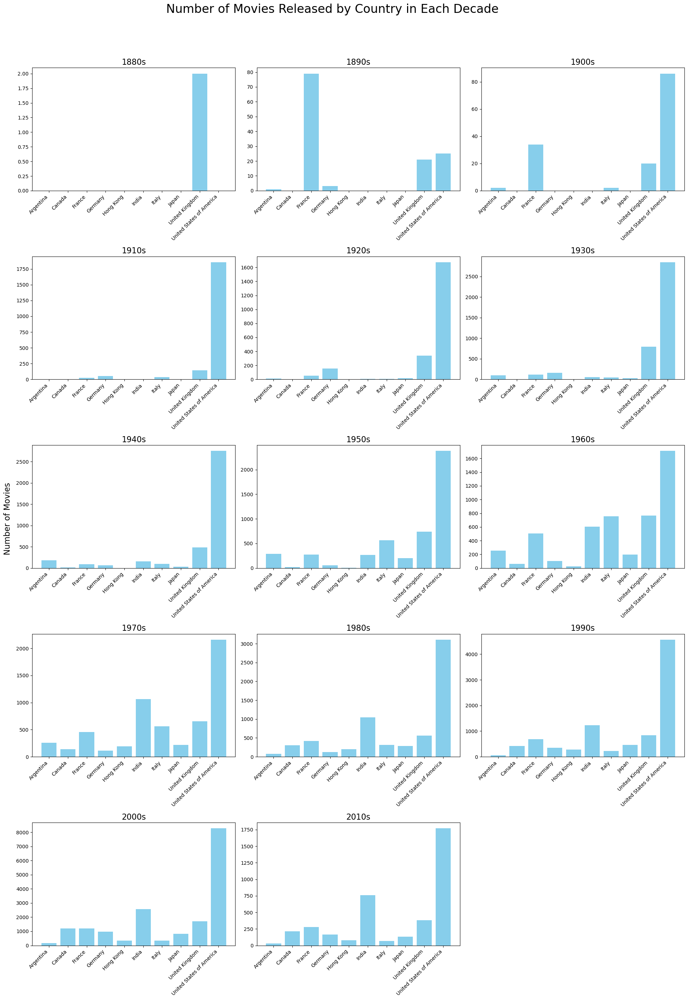

In [38]:
movies_per_decade_by_country = movies_per_decade.T

num_decades = len(movies_per_decade_by_country.index)
rows = 5
cols = 3  

fig, axes = plt.subplots(rows, cols, figsize=(20, 30), sharey=False)
fig.suptitle('Number of Movies Released by Country in Each Decade', fontsize=24)
axes = axes.flatten()

# Plot each decade’s genre distribution in its own subplot
for i, decade in enumerate(movies_per_decade_by_country.index):
    ax = axes[i]  
    ax.bar(movies_per_decade_by_country.columns, movies_per_decade_by_country.loc[decade], color='skyblue', width=0.8)
    ax.set_title(f"{decade}s", fontsize=16)
    ax.set_xticks(range(len(movies_per_decade_by_country.columns)))
    ax.set_xticklabels(movies_per_decade_by_country.columns, rotation=45, fontsize=10, ha='right')
for j in range(num_decades, len(axes)):
    axes[j].set_visible(False)

fig.text(0.04, 0.5, 'Number of Movies', va='center', rotation='vertical', fontsize=16)
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])  
plt.show()


## Normalised

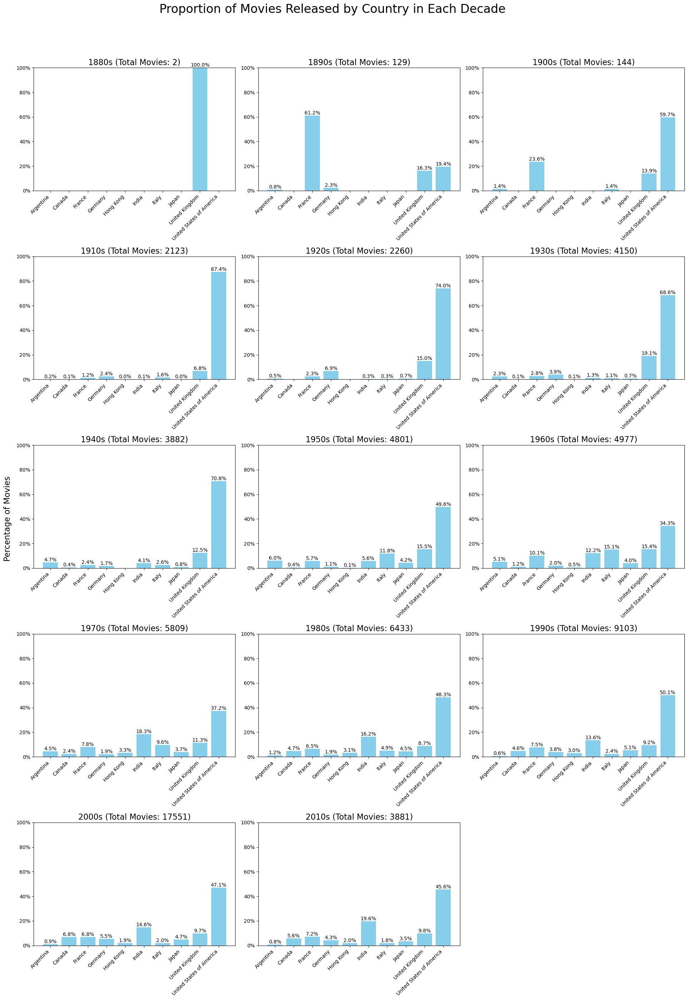

In [39]:
# Normalize the data by dividing each country's count by the total movies in that decade
movies_per_decade_normalized = movies_per_decade_by_country.div(movies_per_decade_by_country.sum(axis=1), axis=0)

total_movies_per_decade = movies_per_decade_by_country.sum(axis=1)

num_decades = len(movies_per_decade_normalized.index)
rows = 5
cols = 3  

fig, axes = plt.subplots(rows, cols, figsize=(20, 30), sharey=False)
fig.suptitle('Proportion of Movies Released by Country in Each Decade', fontsize=24)
axes = axes.flatten()


for i, decade in enumerate(movies_per_decade_normalized.index):
    ax = axes[i]  
    bars = ax.bar(movies_per_decade_normalized.columns, movies_per_decade_normalized.loc[decade], color='skyblue', width=0.8)
    ax.set_title(f"{decade}s (Total Movies: {total_movies_per_decade.loc[decade]})", fontsize=16)
    ax.set_xticks(range(len(movies_per_decade_normalized.columns)))
    ax.set_xticklabels(movies_per_decade_normalized.columns, rotation=45, fontsize=10, ha='right')
    ax.set_ylim(0, 1)  
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0)) 

    for bar in bars:
        height = bar.get_height()
        if height > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1%}', ha='center', va='bottom', fontsize=10)

for j in range(num_decades, len(axes)):
    axes[j].set_visible(False)

fig.text(0.04, 0.5, 'Percentage of Movies', va='center', rotation='vertical', fontsize=16)
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])  
plt.show()


The U.S. consistently dominates movie production across all decades, though its share decreases over time from near-total dominance in the early 20th century to around 40-50% in the later decades. Other countries, such as India, the UK, and France, start contributing more significantly from the 1950s onward, indicating a diversification in global movie production over the decades.

## NORMALIZE ????

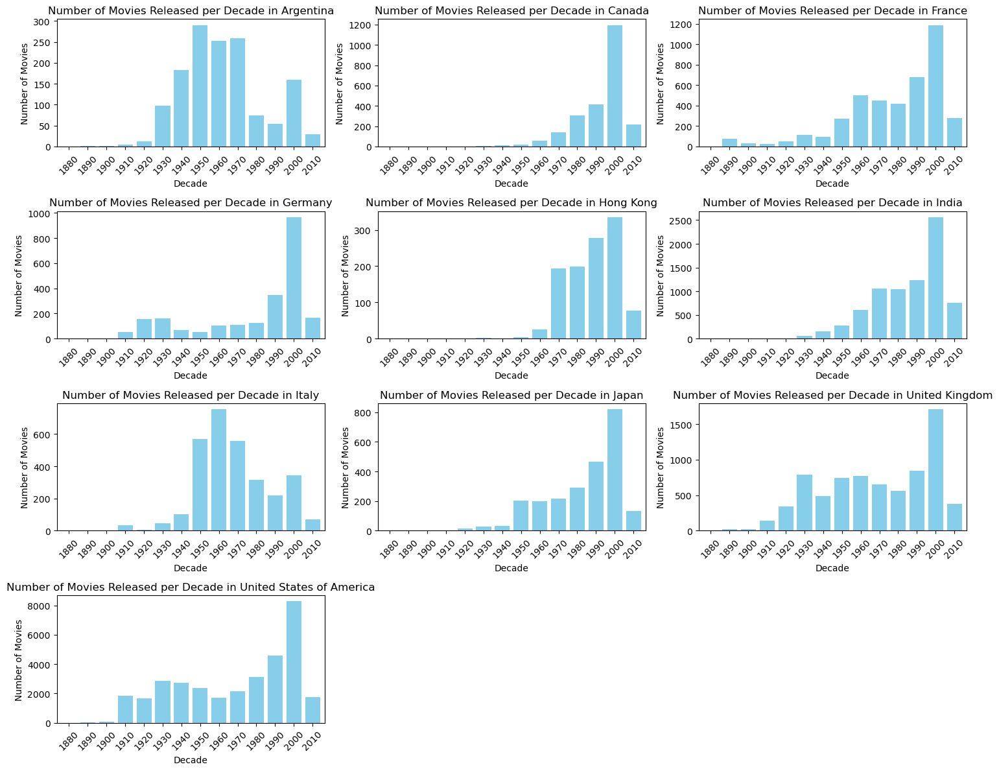

In [41]:
# Define the number of rows and columns for the grid
n_rows, n_cols = 4, 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 12)) 

axes = axes.flatten()

# Loop through each country and plot the data
for i, country in enumerate(movies_per_decade.index):
    ax = axes[i]
    
    movies_per_decade.loc[country].plot(kind='bar', color='skyblue', width=0.8, ax=ax)

    ax.set_xlabel('Decade')
    ax.set_ylabel('Number of Movies')
    ax.set_title(f'Number of Movies Released per Decade in {country}')
    ax.tick_params(axis='x', rotation=45)

# Remove any empty subplot
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to avoid overlapping
plt.tight_layout()

plt.show()


The U.S. shows consistently high movie production, especially peaking in the 2000s. India and France have steady growth, with notable increases in recent decades. Germany and Italy had peaks earlier but later declined or stabilized. Overall, while the U.S. maintained growth, other countries show varied trends with peaks and drops over time.

## 6. Movie per year for top genres

In [42]:
# Get top 10 countries releasing movies
top_20_genres = genres_counts.head(20).index

# Get one country per row
expanded_df_genre = metadata_df_cleaned.explode('Movie genres')

# the top 10
top_genres_df = expanded_df_genre[expanded_df_genre['Movie genres'].isin(top_20_genres)]

movies_per_year_genres = top_genres_df.groupby(['Movie genres', 'Movie release date']).size().unstack(fill_value=0)
movies_per_decade_genres = movies_per_year_genres.groupby((movies_per_year_genres.columns // 10) * 10, axis=1).sum()

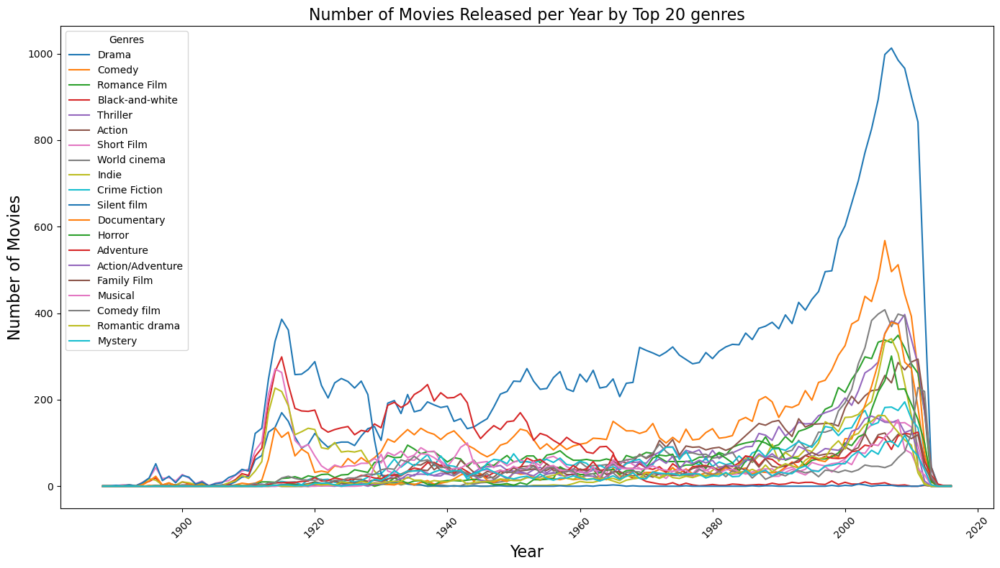

In [43]:
plt.figure(figsize=(14, 8))

# Plot a line for each top country
for genre in top_20_genres:
    if genre in movies_per_year_genres.index:  
        plt.plot(movies_per_year_genres.columns, movies_per_year_genres.loc[genre], label=genre)

plt.xlabel('Year', fontsize = 16)
plt.ylabel('Number of Movies', fontsize = 16)
plt.title('Number of Movies Released per Year by Top 20 genres', fontsize = 16)
plt.legend(title='Genres')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

We see that drama has always been the most popular genre, with big growth starting in the 1970s and peaking in the 2000s. Comedy, documentaries, and horror also grew, especially after the 1960s. Overall, more genres became popular over time, showing that the movie industry started to offer a wider variety of films.

## PLOT CLARA -> MAIS NORMALIZE ET AVEC PECENTAGE

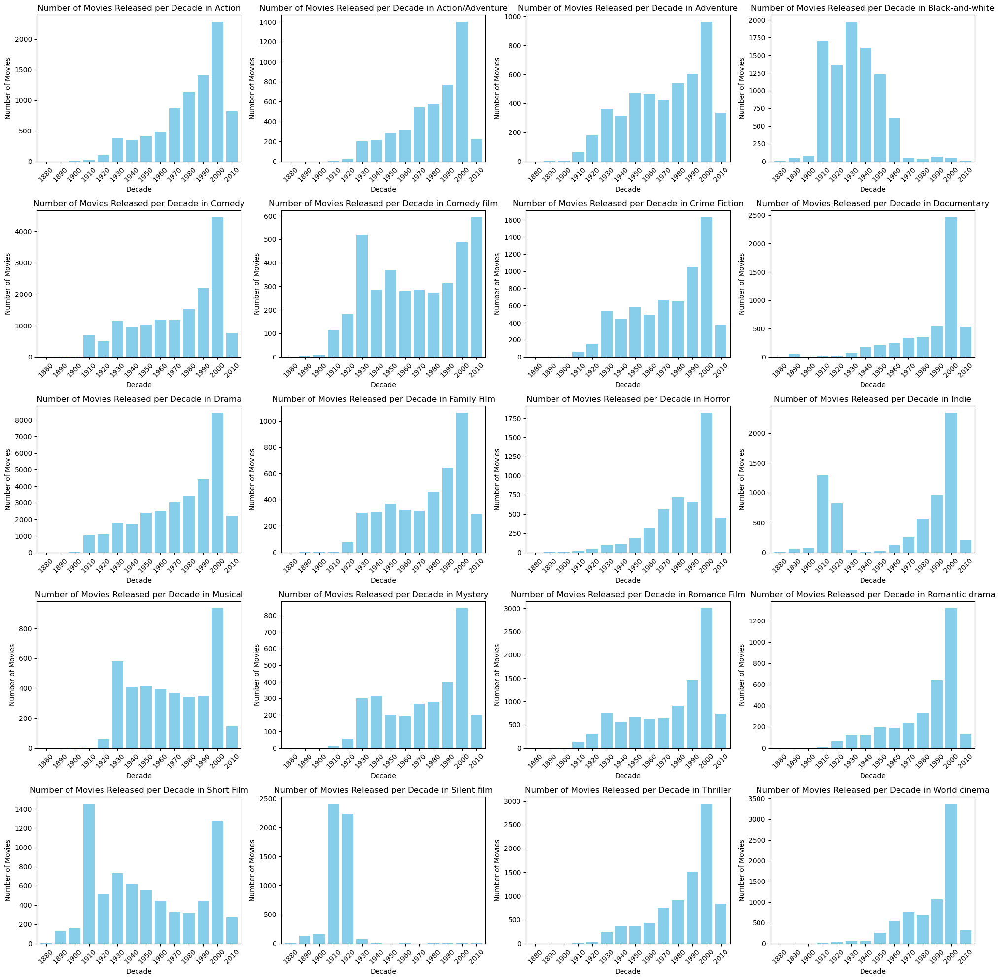

In [44]:
# Plot a bar chart for each genre in years
n_rows, n_cols = 5, 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20))  # Create a 5x4 grid of subplots
axes = axes.flatten()

# Loop through each genre and plot the data
for i, genre in enumerate(movies_per_decade_genres.index):
    ax = axes[i]
    
    # Plot the bar chart for the current genre
    movies_per_decade_genres.loc[genre].plot(kind='bar', color='skyblue', width=0.8, ax=ax)

    ax.set_xlabel('Decade')
    ax.set_ylabel('Number of Movies')
    ax.set_title(f'Number of Movies Released per Decade in {genre}')
    ax.tick_params(axis='x', rotation=45)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout()
plt.show()

These plots show that drama, comedy, and documentary movies have steadily increased over time, peaking in the 2000s. Genres like black-and-white and silent films were popular in the early 20th century but declined afterward. More action, horror, and thriller movies have emerged in recent decades, reflecting changing audience preferences. Overall, the data indicates a shift towards more diverse genres over time, with significant growth in certain types of films in the latter half of the 20th century and beyond.

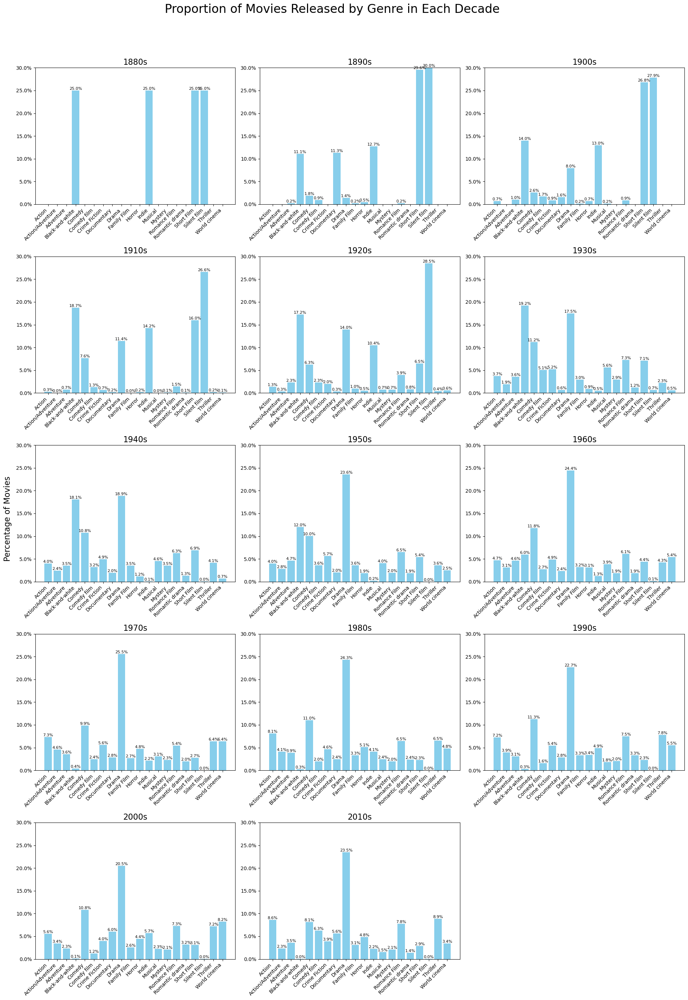

In [46]:
movies_per_decade_by_genre = movies_per_decade_genres.T

# Normalize the data by dividing each genre's count by the total number of movies in that decade
movies_per_decade_by_genre_normalized = movies_per_decade_by_genre.div(movies_per_decade_by_genre.sum(axis=1), axis=0)

num_decades = len(movies_per_decade_by_genre_normalized.index)
rows = 5  
cols = 3  

fig, axes = plt.subplots(rows, cols, figsize=(20, 30), sharey=False)
fig.suptitle('Proportion of Movies Released by Genre in Each Decade', fontsize=24)
axes = axes.flatten()

# Plot each decade’s genre distribution in its own subplot
for i, decade in enumerate(movies_per_decade_by_genre_normalized.index):
    ax = axes[i]  
    bars = ax.bar(movies_per_decade_by_genre_normalized.columns, movies_per_decade_by_genre_normalized.loc[decade], color='skyblue', width=0.8)
    ax.set_title(f"{decade}s", fontsize=16)
    ax.set_xticks(range(len(movies_per_decade_by_genre_normalized.columns)))
    ax.set_xticklabels(movies_per_decade_by_genre_normalized.columns, rotation=45, fontsize=10, ha='right')
    ax.set_ylim(0, 0.3) 
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    
    for bar in bars:
        height = bar.get_height()
        if height > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1%}', ha='center', va='bottom', fontsize=8)

for j in range(num_decades, len(axes)):
    axes[j].set_visible(False)

fig.text(0.04, 0.5, 'Percentage of Movies', va='center', rotation='vertical', fontsize=16)
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.show()


We see how movie genre preferences have shifted over the decades. Early on (1880s to 1930s), genres like silent films and short films were prominent. Starting from the 1940s, drama began to dominate, maintaining significant popularity throughout the later decades. Other genres, such as comedy and action, started to gain more consistent representation after the 1950s. By the 2000s and 2010s, the diversity in genre production became more apparent, with a wider spread across different genres, reflecting evolving audience tastes and industry trends.

## 7. Summaries data exploration 

In [95]:
file_movie = './plot_summaries.txt'
sum_df = pd.read_csv(file_movie, sep='\t', header=None)

sum_df.columns = [
    'Wikipedia movie ID',
    'Plot summary'
]

In [96]:
sum_df.head()

,Wikipedia movie ID,Plot summary
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha..."
1,31186339,The nation of Panem consists of a wealthy Capi...
2,20663735,Poovalli Induchoodan is sentenced for six yea...
3,2231378,"The Lemon Drop Kid , a New York City swindler,..."
4,595909,Seventh-day Adventist Church pastor Michael Ch...


In [97]:
sum_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42303 entries, 0 to 42302
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Wikipedia movie ID  42303 non-null  int64 
 1   Plot summary        42303 non-null  object
dtypes: int64(1), object(1)
memory usage: 661.1+ KB


In [98]:
sum_df.isna().sum()

Wikipedia movie ID    0
Plot summary          0
dtype: int64

There is no NaN in this dataset

In [99]:
# Length of each plot summary
sum_df['summary_length'] = sum_df['Plot summary'].apply(len)

In [100]:
sum_df['summary_length'].describe()

count    42303.000000
mean      1784.034229
std       1808.925536
min         99.000000
25%        508.000000
50%       1079.000000
75%       2604.500000
max      28159.000000
Name: summary_length, dtype: float64

On average, movie summaries are about 1,784 characters long. Most summaries range from 508 to 2,604 characters. The shortest summary is 99 characters, and the longest is 28,159 characters, showing that some summaries are much longer than others.

## 8. Word Cloud for all the summaries

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/chloedaul/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


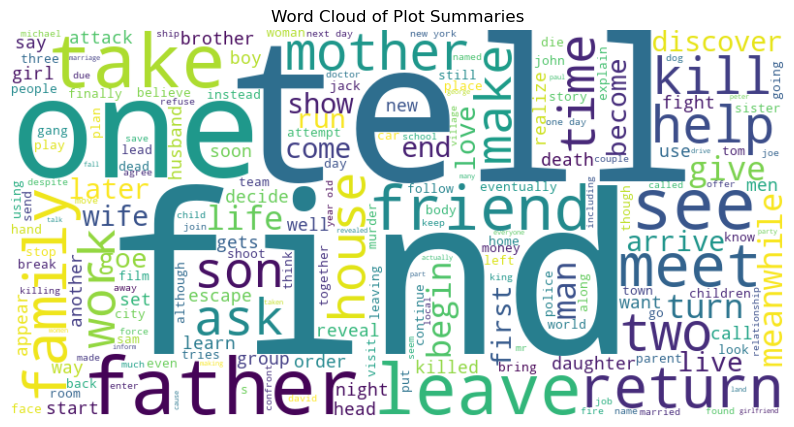

In [108]:
nltk.download('stopwords')

# Define stopwords
stop_words = set(stopwords.words('english'))

# Join all plot summaries into a single string and tokenize
all_text = ' '.join(sum_df['Plot summary'])
words = [word.lower() for word in all_text.split() if word.lower() not in stop_words]

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(words))

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Plot Summaries')
plt.show()

## COMMENT ?

## 9. Word cloud per top genre

In [120]:
genre_df = metadata_df_cleaned[['Wikipedia movie ID', 'Movie genres', 'Movie release date']]

# Merge plot summaries with genres based on the Wikipedia movie ID
merged_df = pd.merge(sum_df, genre_df, on='Wikipedia movie ID', how='left')

merged_df.head()

,Wikipedia movie ID,Plot summary,summary_length,Movie genres,Movie release date
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha...",178,"[Drama, World cinema]",1990
1,31186339,The nation of Panem consists of a wealthy Capi...,4559,"[Action/Adventure, Science Fiction, Action, Dr...",2012
2,20663735,Poovalli Induchoodan is sentenced for six yea...,3099,"[Musical, Action, Drama, Bollywood]",2000
3,2231378,"The Lemon Drop Kid , a New York City swindler,...",4917,"[Screwball comedy, Comedy]",1951
4,595909,Seventh-day Adventist Church pastor Michael Ch...,2425,"[Crime Fiction, Drama, Docudrama, World cinema...",1988


In [121]:
sum_df.isna().sum()

Wikipedia movie ID    0
Plot summary          0
summary_length        0
dtype: int64

In [122]:
all_genres = merged_df['Movie genres'].explode()  
top_genres = all_genres.value_counts().head(20)
top_genre_names = top_genres.index.tolist()
top_genre_names

['Drama',
 'Comedy',
 'Romance Film',
 'Thriller',
 'Action',
 'World cinema',
 'Crime Fiction',
 'Horror',
 'Black-and-white',
 'Indie',
 'Action/Adventure',
 'Adventure',
 'Family Film',
 'Short Film',
 'Romantic drama',
 'Musical',
 'Science Fiction',
 'Animation',
 'Mystery',
 'Romantic comedy']

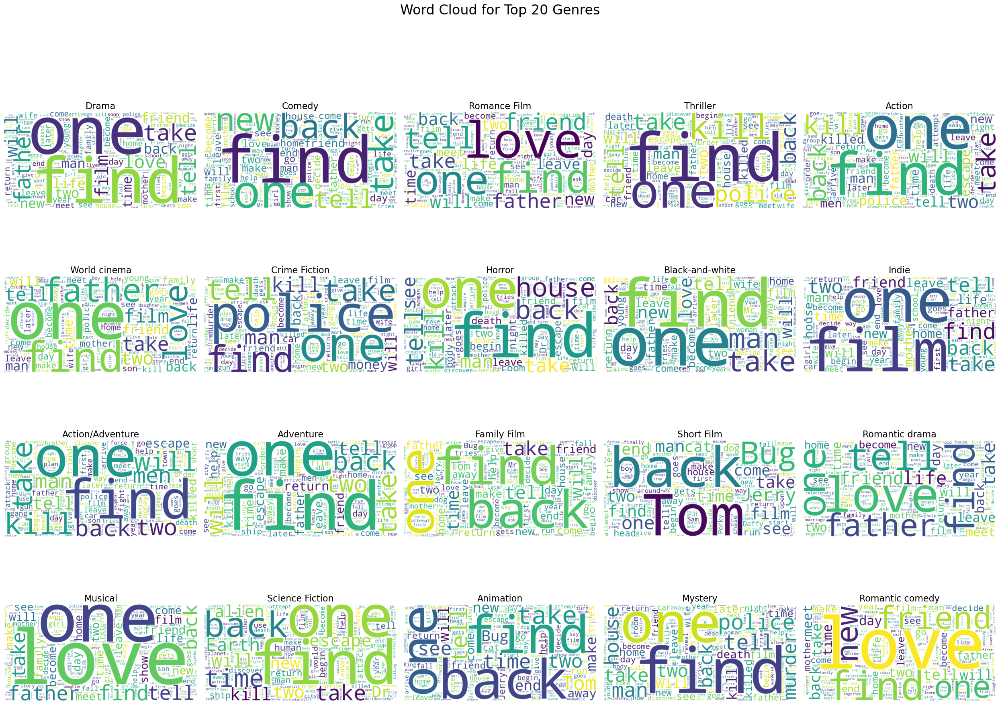

In [123]:
merged_df_genre = merged_df.copy()
merged_df_genre['Movie genres'] = merged_df['Movie genres'].apply(lambda x: x if isinstance(x, list) else [])

top_genre_names = top_genres.index.tolist()

fig, axes = plt.subplots(4, 5, figsize=(25, 20)) 
fig.suptitle('Word Cloud for Top 20 Genres', fontsize=24)
axes = axes.flatten()

# Generate word clouds for each top genre
for i, genre in enumerate(top_genre_names):
    genre_summaries = merged_df_genre[merged_df_genre['Movie genres'].apply(lambda genres: genre in genres)]['Plot summary']
    
    combined_text = ' '.join(genre_summaries)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate(combined_text)
    
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set_title(genre, fontsize=16)

for j in range(len(top_genre_names), len(axes)):
    axes[j].axis('off')


plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
plt.show()

## COMMENT?

## 10. Word cloud per decade

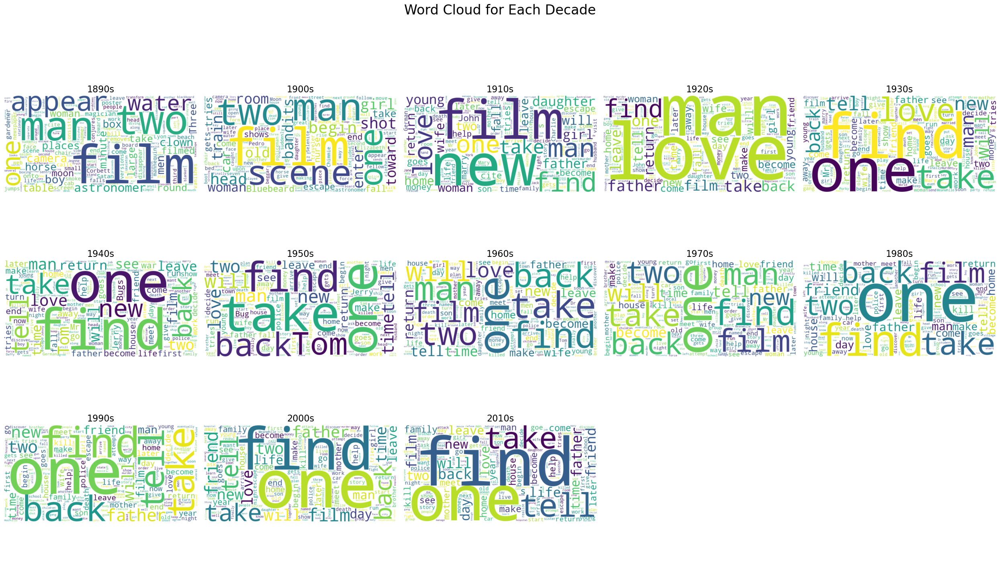

In [124]:
merged_df['Decade'] = (merged_df['Movie release date'] // 10) * 10  

# Get unique decades and sort them
unique_decades = sorted(merged_df['Decade'].dropna().unique())

rows = (len(unique_decades) // 5) + 1  
cols = 5  
fig, axes = plt.subplots(rows, cols, figsize=(25, rows * 5))  
fig.suptitle('Word Cloud for Each Decade', fontsize=24)
axes = axes.flatten()

# Generate word clouds for each decade
for i, decade in enumerate(unique_decades):
    decade_summaries = merged_df[merged_df['Decade'] == decade]['Plot summary']
    
    combined_text = ' '.join(decade_summaries.dropna())
    
    wordcloud = WordCloud(width=800, height=400, background_color='white', collocations=False).generate(combined_text)
    
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set_title(f"{decade}s", fontsize=16)

for j in range(len(unique_decades), len(axes)):
    axes[j].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


## COMMENT?